## Instación de paqueterias

In [1]:
import pandas as pd

In [2]:
!pip install rdkit

Defaulting to user installation because normal site-packages is not writeable


In [3]:
from rdkit import Chem
from rdkit.Chem import Descriptors
from rdkit.Chem.Crippen import MolLogP
from rdkit.Chem.rdMolDescriptors import CalcTPSA

In [4]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.figure_factory as ff

In [5]:
from scipy.spatial.distance import pdist, squareform
import numpy as np
import matplotlib.pyplot as plt

In [6]:
from sklearn.preprocessing import MinMaxScaler
from scipy.cluster.hierarchy import linkage, to_tree
import networkx as nx


## Carga base de datos

In [7]:
# https://docs.google.com/spreadsheets/d/1R46hgPIrLxjF15jLvmUPXBMOKgpnWpotHa5Cc578mTY/edit?usp=sharing
div_df = pd.read_csv('https://docs.google.com/spreadsheets/d/1R46hgPIrLxjF15jLvmUPXBMOKgpnWpotHa5Cc578mTY/export?format=csv')
div_df

,ID,DB,SMILES
0,47035,MedChemRules,COc1cc(CCC(=O)O)ccc1OCc1cccc(-c2coc3[nH]cnc23)c1
1,102444,MOE_Rules,O=c1cc(-c2ccc3c(c2)OC(c2cccc(-c4ccccc4)c2)O3)o...
2,83650,MedChemRules,COC1C(=O)N(CCC(=O)O)CC1OCC1CCCC2(c3ccccc3)CC12
3,31287,MedChemRules,COc1cc(CCc2nc(=S)s[nH]2)ccc1OCc1cccc([N+]2[C-]...
4,91489,MedChemRules,COC1C2CC3CC(CC1(OCC1CC=CC(c4ccccc4)O1)C3)C2CCC...
...,...,...,...
10001,6249,MedChemRules,COc1cc(CCc2c[nH]cn2)ccc1OCC1CC2CCC1C(c1ccccc1)N2
10002,94693,MedChemRules,COC1CC(CCC(=O)O)SCC1OCC1C=C(c2ccccc2)CCN1
10003,46682,MedChemRules,COc1cc(CCC(=O)O)ccc1OCC=NNc1c[nH]c2cc[nH]c12
10004,7033,MedChemRules,COC1CC2(OCc3cccc(-c4ccccc4)c3)CC(CCc3cnco3)C1C2


In [8]:
# https://docs.google.com/spreadsheets/d/1NsgnQI-A0ale7uZeiUF7pBF91vEOT4ouwlxA3Klz-Bc/edit?usp=sharing
aleatory_df = pd.read_csv('https://docs.google.com/spreadsheets/d/1NsgnQI-A0ale7uZeiUF7pBF91vEOT4ouwlxA3Klz-Bc/export?format=csv')
aleatory_df

,ID,DB,SMILES
0,4198,MedChemRules,COc1cc(CCS2(=O)=NC(=O)CN2)ccc1OCc1cc2n(n1)C(c1...
1,5202,MedChemRules,COc1cc(CCC2CCC(=O)C2=O)ccc1OCc1cccc([N+]2[C-]O...
2,56235,MedChemRules,COc1sc2c(CCC(=O)O)csc2c1OCc1nc(-c2ccccc2)cs1
3,4064,MedChemRules,COc1cc(CCS2(=O)=NC(=O)CN2)ccc1OCc1cccc(-c2cc[n...
4,45212,MedChemRules,COc1cc(CCC(=O)O)ccc1OCc1csc2cc(C34CC(C3)C4)oc12
...,...,...,...
10002,1185,MedChemRules,COc1cc(CCc2no[nH]c2=O)ccc1OCC12CCC(CS1)C(c1ccc...
10003,24300,MedChemRules,COc1cc(CCn2nnc(=O)s2)ccc1OCc1cccc(N2CCSCC2)c1
10004,85293,MedChemRules,COC1CC2(C=CC2CCC(=O)O)C1OCc1cccc(N2CCCC2=O)c1
10005,70065,MedChemRules,COc1cc(CCC(=O)O)ccc1OCC1CC(c2nc3ncoc3o2)=CCN1


In [9]:
# https://docs.google.com/spreadsheets/d/1Jn6e8L8LiEFKJqr5_9jfslzQuGgkxrgTt-CoHuF_t-Y/edit?usp=sharing
extremes_df = pd.read_csv('https://docs.google.com/spreadsheets/d/1Jn6e8L8LiEFKJqr5_9jfslzQuGgkxrgTt-CoHuF_t-Y/export?format=csv')
extremes_df

,ID,DB,SMILES
0,47035,MedChemRules,COc1cc(CCC(=O)O)ccc1OCc1cccc(-c2coc3[nH]cnc23)c1
1,434,MedChemRules,COc1cc(CCC(=O)O)ccc1OCc1cccc(-c2ccncc2)c1
2,793,MedChemRules,COc1cc(CCC(=O)O)ccc1OCc1cccc(-c2ncccn2)c1
3,677,MedChemRules,COc1cc(CCC(=O)O)ccc1OCc1cccc(-c2ccon2)c1
4,77923,MedChemRules,COc1cc(CCC(=O)O)ccc1OCc1cccc(-c2nc3ccnn3s2)c1
...,...,...,...
10001,102356,MOE_Rules,O=C1CC(c2ccc3c(c2)OC(c2cccc(-c4ccccc4)c2)O3)SN1
10002,102444,MOE_Rules,O=c1cc(-c2ccc3c(c2)OC(c2cccc(-c4ccccc4)c2)O3)o...
10003,102275,MOE_Rules,O=C1CC(c2ccc3c(c2)OC(c2cccc(-c4ccccc4)c2)O3)NN1
10004,102533,MOE_Rules,O=c1cc(-c2ccc3c(c2)OC(c2cccc(-c4ccccc4)c2)O3)[...


In [10]:
#https://docs.google.com/spreadsheets/d/1TWwcwA7i1IXjNXDtR8TMMvXw5VK24R8zZayDXtpmGKY/edit?usp=sharing
medoids_df = pd.read_csv('https://docs.google.com/spreadsheets/d/1TWwcwA7i1IXjNXDtR8TMMvXw5VK24R8zZayDXtpmGKY/export?format=csv')
medoids_df

,ID,DB,SMILES
0,47035,MedChemRules,COc1cc(CCC(=O)O)ccc1OCc1cccc(-c2coc3[nH]cnc23)c1
1,434,MedChemRules,COc1cc(CCC(=O)O)ccc1OCc1cccc(-c2ccncc2)c1
2,793,MedChemRules,COc1cc(CCC(=O)O)ccc1OCc1cccc(-c2ncccn2)c1
3,677,MedChemRules,COc1cc(CCC(=O)O)ccc1OCc1cccc(-c2ccon2)c1
4,77923,MedChemRules,COc1cc(CCC(=O)O)ccc1OCc1cccc(-c2nc3ccnn3s2)c1
...,...,...,...
10001,77192,MedChemRules,COc1cc(CCC(=O)O)ccc1OCC1CC(c2nc3scnc3o2)=CCN1
10002,84766,MedChemRules,COc1cc(CCC(=O)O)ccc1OCN1CCC(c2cncs2)C1=O
10003,91104,MedChemRules,COc1cc(CCC(=O)O)ccc1OCC1=CC(c2csc3nccn23)SCC1
10004,51775,MedChemRules,COc1cc(CCC(=O)O)sc1OCc1cccc(-c2cc3[nH]ccc3[nH]...


In [11]:
#https://docs.google.com/spreadsheets/d/1EKjwlGDH9iywBpR1Gh33NMZ1P3UNsejMFGld424Qyo4/edit?usp=sharing
outlier_df = pd.read_csv('https://docs.google.com/spreadsheets/d/1EKjwlGDH9iywBpR1Gh33NMZ1P3UNsejMFGld424Qyo4/export?format=csv')
outlier_df

,ID,DB,SMILES
0,47035,MedChemRules,COc1cc(CCC(=O)O)ccc1OCc1cccc(-c2coc3[nH]cnc23)c1
1,434,MedChemRules,COc1cc(CCC(=O)O)ccc1OCc1cccc(-c2ccncc2)c1
2,793,MedChemRules,COc1cc(CCC(=O)O)ccc1OCc1cccc(-c2ncccn2)c1
3,677,MedChemRules,COc1cc(CCC(=O)O)ccc1OCc1cccc(-c2ccon2)c1
4,77923,MedChemRules,COc1cc(CCC(=O)O)ccc1OCc1cccc(-c2nc3ccnn3s2)c1
...,...,...,...
10001,77192,MedChemRules,COc1cc(CCC(=O)O)ccc1OCC1CC(c2nc3scnc3o2)=CCN1
10002,84766,MedChemRules,COc1cc(CCC(=O)O)ccc1OCN1CCC(c2cncs2)C1=O
10003,91104,MedChemRules,COc1cc(CCC(=O)O)ccc1OCC1=CC(c2csc3nccn23)SCC1
10004,51775,MedChemRules,COc1cc(CCC(=O)O)sc1OCc1cccc(-c2cc3[nH]ccc3[nH]...


In [12]:
#https://docs.google.com/spreadsheets/d/1np8PRh0ccxyvDXv4iMNthQ4OgU9tMm8TJIAOAoq--oU/edit?usp=sharing
quota_df = pd.read_csv('https://docs.google.com/spreadsheets/d/1np8PRh0ccxyvDXv4iMNthQ4OgU9tMm8TJIAOAoq--oU/export?format=csv')
quota_df

,ID,DB,SMILES
0,47035,MedChemRules,COc1cc(CCC(=O)O)ccc1OCc1cccc(-c2coc3[nH]cnc23)c1
1,55074,MedChemRules,COc1cc(CCC(=O)O)ccc1OCc1cccc(-c2cn3cccc3s2)c1
2,38439,MedChemRules,COc1cc(CCC(=O)O)ccc1OCc1cc2occ(C3(C)CC3)c2[nH]1
3,91779,MedChemRules,COc1cc(CCC(=O)O)ccc1OCC1CC=CC(C2SC3CCC2CC3)N1
4,30725,MedChemRules,COc1cc(CCc2noc(=S)s2)ccc1OCc1cccc(C2CC3(C=CC3)...
...,...,...,...
10001,30216,MedChemRules,COc1cc(CCc2noc(=S)o2)ccc1OCc1cccc(-c2cnccn2)c1
10002,16768,MedChemRules,COc1cc(CCc2nsc(=O)s2)ccc1OCNN=Cc1ccccc1
10003,21737,MedChemRules,COc1sc2c(CCc3nnns3)cccc2c1OCc1cccc(-c2ccccc2)c1
10004,3707,MedChemRules,COC1CC2(CCS3(=O)=NC(=O)CN3)CCC1(OCc1cccc(-c3cc...


In [13]:
#https://docs.google.com/spreadsheets/d/1cYYQO47JNAkYwvkILFMnNdQx4YvsZ2aIYUZTI-gz1aA/edit?usp=sharing
strat_df = pd.read_csv('https://docs.google.com/spreadsheets/d/1cYYQO47JNAkYwvkILFMnNdQx4YvsZ2aIYUZTI-gz1aA/export?format=csv')
strat_df

,ID,DB,SMILES
0,47035,MedChemRules,COc1cc(CCC(=O)O)ccc1OCc1cccc(-c2coc3[nH]cnc23)c1
1,678,MedChemRules,COc1cc(CCC(=O)O)ccc1OCc1cccc(-c2cc[nH]n2)c1
2,238,MedChemRules,COc1cc(CCC(=O)O)ccc1OCc1cccc(C2CC2)c1
3,506,MedChemRules,COc1cc(CCC(=O)O)ccc1OCc1cccc(-c2cnsn2)c1
4,117,MedChemRules,COc1cc(CCC(=O)O)ccc1OCc1cccc(-c2nc3ocnc3s2)c1
...,...,...,...
10001,98063,MedChemRules,COC12CC3CC(CC(CCC(=O)O)(C3)C1)C2OCC1CC(c2ccccc...
10002,98514,MedChemRules,COC12CC3CC(CC(CCC(=O)O)(C3)C1)C2OCC1CC(c2ccccc...
10003,86589,MedChemRules,COC1C(CCC(=O)O)CC(=O)N1OCC12CC3CC(C1)CC(c1cccc...
10004,93207,MedChemRules,COC12CC3CC(CC(CCC(=O)O)(C3)C1)C2OCC1C=CCC(c2cc...


In [14]:
### Dianat
# https://docs.google.com/spreadsheets/d/12qZaZ2YZVgjUfjjNcXSf0Ys5FhVS6Rv9PvCN_5Tbl9E/edit?usp=sharing
Dianat_df = pd.read_csv('https://docs.google.com/spreadsheets/d/12qZaZ2YZVgjUfjjNcXSf0Ys5FhVS6Rv9PvCN_5Tbl9E/export?format=csv')
Dianat_df

,ID,SMILES,LogS,LogD,LogP,Pgp-inh,Pgp-sub,HIA,F(20%),F(30%),...,MCE-18,Natural Product-likeness,Alarm_NMR,BMS,Chelating,PAINS,Lipinski,Pfizer,GSK,GoldenTriangle
0,DiaNatDB-1,O=C(O)C1CC(=O)C(O)C(O)C1,-307.000,-1.129,-1.541,1.00,137.00,267.00,9.0,29.0,...,22.667,2.101,0,0,0,0,Accepted,Accepted,Accepted,Rejected
1,DiaNatDB-2,COc1ccc2cc3[n+](cc2c1OC)CCc1cc2c(cc1-3)OCO2,-6.311,3.482,4.309,13.00,1.00,3.00,14.0,192.0,...,56.000,1.302,1,0,0,0,Accepted,Rejected,Rejected,Accepted
2,DiaNatDB-3,O=c1c2ccccc2nc2n1CCC2O,-1.644,594.000,524.000,3.00,36.00,0.07,928.0,998.0,...,51.429,133.000,0,0,0,0,Accepted,Accepted,Accepted,Accepted
3,DiaNatDB-5,O=C1CCN2Cc3ccccc3NC12,-1.273,871.000,1.162,0.00,11.00,17.00,3.0,239.0,...,49.467,-104.000,0,0,0,0,Accepted,Accepted,Accepted,Rejected
4,DiaNatDB-6,C=C(C)C(=O)OC1=C2C(=C)C(=O)OC2C2C(C=O)CC(=O)C2...,-2.659,991.000,1.086,5.00,0.00,54.00,9.0,3.0,...,52.500,1.564,3,3,0,0,Accepted,Accepted,Accepted,Accepted
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
331,DiaNatDB-336,O=C(C=Cc1ccc(O)cc1)OC[C@H]1O[C@H](Oc2c(-c3ccc(...,-4.233,2.291,3.010,7.00,0.43,184.00,372.0,997.0,...,104.889,1.648,3,0,0,0,Rejected,Accepted,Rejected,Rejected
332,DiaNatDB-337,CC(C)=CCC[C@]1(C)C=Cc2c(c(C)cc3c2[nH]c2cc(O)cc...,-4.471,4.990,6.571,0.99,15.00,14.00,924.0,448.0,...,73.600,2.721,1,0,0,0,Accepted,Rejected,Rejected,Accepted
333,DiaNatDB-338,CC(C)=CCCC1(C)C=Cc2c(c(C)cc3c2[nH]c2ccccc23)O1,-6.743,5.258,6.923,996.00,43.00,11.00,43.0,325.0,...,70.533,2.478,1,0,0,0,Accepted,Rejected,Rejected,Rejected
334,DiaNatDB-339,COc1cc(/C=C/CO)cc(OC)c1O[C@@H]1O[C@H](CO)[C@@H...,-1.324,-642.000,-395.000,3.00,936.00,322.00,11.0,566.0,...,50.769,1.913,1,0,0,0,Accepted,Accepted,Accepted,Accepted


In [15]:
T2DMdf_df = pd.read_csv('https://docs.google.com/spreadsheets/d/1Y6HfrBuZi46VPSo7jj54sCzRunHuPqQGXqnmM_G6pw4/export?format=csv')
T2DMdf_df
columnas_seleccionadas = ['ID', 'SMILES', "QED", "Synth", "PAINS", "Lipinski"]
T2DM_df = T2DMdf_df[columnas_seleccionadas]
T2DM_df

,ID,SMILES,QED,Synth,PAINS,Lipinski
0,1,COC(=O)C12CCC(C)(C)C=C1C1CCC3C4(C)CCC(=O)C(C)(...,295.00,4.687,0,Accepted
1,2,COc1cc(CCC(=O)O)ccc1OCc1cccc(-c2ccccc2)c1,615.00,1.764,0,Accepted
2,3,COc1ccc(C=C2SC(=O)NC2=O)cc1OCc1cccc(-c2ccccc2)c1,554.00,2.167,0,Accepted
3,4,O=C1NC(=O)C(=Cc2ccc(OCc3nc4ccccc4[nH]3)cc2)S1,703.00,2.318,0,Accepted
4,5,COc1cc(C=C2SC(=O)NC2=O)ccc1OCc1nc2ccccc2[nH]1,658.00,2.381,0,Accepted
...,...,...,...,...,...,...
86,87,CCOc1ccc(Cc2cc(C3OC(SC)C(O)C(O)C3O)ccc2Cl)cc1,661.00,3.694,0,Accepted
87,88,COc1c(C2OC(CO)C(C)C(O)C2O)cc(Cc2ccc3c(c2)OCCO3...,623.00,4.179,0,Accepted
88,89,OCC1OC(c2ccc(Cl)c(Cc3ccc4c(c3)CC4)c2)C(O)C(O)C1O,636.00,3.630,0,Accepted
89,90,CCc1ccc(C2OC(CO)C(O)C(O)C2O)cc1Cc1ccc2c(c1)OCCO2,579.00,3.728,0,Accepted


In [16]:
## Approved_Drugs_T2DM ##
ApprovedT2DMdf_df = pd.read_csv('https://docs.google.com/spreadsheets/d/12rMrFbtww9PFJ3gE-hhkzbxpertQLbtDtyo32-rn9X8/export?format=csv')
columnas_seleccionadas = ['ID', 'SMILES', "QED", "Synth", "PAINS", "Lipinski"]
ApprovedT2DM_df = ApprovedT2DMdf_df[columnas_seleccionadas]
ApprovedT2DM_df

,ID,SMILES,QED,Synth,PAINS,Lipinski
0,DB00284,CC1OC(OC2C(CO)OC(OC(C(=O)C(O)CO)C(O)CO)C(O)C2O...,83.00,5.731,0,Rejected
1,DB06203,Cn1c(=O)cc(N2CCCC(N)C2)n(Cc2ccccc2C#N)c1=O,873.00,3.025,0,Accepted
2,DB01076,CC(C)c1c(C(=O)Nc2ccccc2)c(-c2ccccc2)c(-c2ccc(F...,163.00,3.305,0,Accepted
3,DB12236,OCC1OC(c2ccc(Cl)c(Cc3ccc(OCCOC4CC4)cc3)c2)C(O)...,0.42,3.670,0,Accepted
4,DB01200,CC(C)CC1C(=O)N2CCCC2C2(O)OC(NC(=O)C3=CC4c5cccc...,456.00,5.133,0,Accepted
5,DB08907,Cc1ccc(C2OC(CO)C(O)C(O)C2O)cc1Cc1ccc(-c2ccc(F)...,486.00,3.685,0,Accepted
6,DB00672,CCCNC(=O)NS(=O)(=O)c1ccc(Cl)cc1,879.00,1.799,0,Accepted
7,DB00930,C=CCNCCCCCC[N+](C)(C)C,0.34,2.652,0,Accepted
8,DB06292,CCOc1ccc(Cc2cc(C3OC(CO)C(O)C(O)C3O)ccc2Cl)cc1,582.00,3.453,0,Accepted
9,DB09038,OCC1OC(c2ccc(Cl)c(Cc3ccc(OC4CCOC4)cc3)c2)C(O)C...,529.00,3.844,0,Accepted


In [17]:
MultiPTP1Bdf_df = pd.read_csv('https://docs.google.com/spreadsheets/d/1br3FD9JtTxlr6b4SdXiebcuJrOTEX6Ml32-EXyrfNa4/export?format=csv')
columnas_seleccionadas = ['SMILES', "QED", "Synth", "PAINS", "Lipinski"]
MultiPTP1B_df = MultiPTP1Bdf_df[columnas_seleccionadas]
MultiPTP1B_df

,SMILES,QED,Synth,PAINS,Lipinski
0,CON1C(=O)CN(CC2=NC(=O)NC2=O)CC1OCc1cccc(-c2ccc...,727.00,3.518,0,Accepted
1,COc1cn(CC2=NC(=O)NC2=O)cc1OCc1cccc(-c2ccccc2)c1,671.00,2.810,0,Accepted
2,COc1ccc(CC(=O)O)cc1OCC1CC2(CCC2c2ccccc2)C1,773.00,3.297,0,Accepted
3,COc1ccc(CC(=O)O)cc1OCC1CCC(=O)N(c2ccccc2)C1,811.00,2.528,0,Accepted
4,COc1ccc(CC(=O)O)cc1OCC1OC2CCC1C(c1ccccc1)C2,783.00,4.190,0,Accepted
...,...,...,...,...,...
811,COC1OC(SCC(=O)O)OCC1OCc1cccc(-c2ccccc2)c1,741.00,3.654,0,Accepted
812,COC1OC(SCC(=O)O)NC1OCc1cccc(-c2ccccc2)c1,735.00,3.769,0,Accepted
813,COC1CC(OCc2cccc(-c3ccccc3)c2)COC(SCC(=O)O)O1,718.00,3.715,0,Accepted
814,COC1=C(OCc2cccc(-c3ccccc3)c2)COC(SCC(=O)O)C1,0.73,3.291,0,Accepted


In [18]:

#https://docs.google.com/spreadsheets/d/1oMcWTVAOsrk-PBYMWfsH4EPf78UqQjsnCM1QLsBeww4/edit?usp=sharing

concatenated_df = pd.read_csv('https://docs.google.com/spreadsheets/d/1oMcWTVAOsrk-PBYMWfsH4EPf78UqQjsnCM1QLsBeww4/export?format=csv')

concatenated_df

,Unnamed: 0,ID,SMILES,DATASET
0,0,47035,COc1cc(CCC(=O)O)ccc1OCc1cccc(-c2coc3[nH]cnc23)c1,divi
1,1,102444,O=c1cc(-c2ccc3c(c2)OC(c2cccc(-c4ccccc4)c2)O3)o...,divi
2,2,83650,COC1C(=O)N(CCC(=O)O)CC1OCC1CCCC2(c3ccccc3)CC12,divi
3,3,31287,COc1cc(CCc2nc(=S)s[nH]2)ccc1OCc1cccc([N+]2[C-]...,divi
4,4,91489,COC1C2CC3CC(CC1(OCC1CC=CC(c4ccccc4)O1)C3)C2CCC...,divi
...,...,...,...,...
70507,70507,DB01124,CCCCNC(=O)NS(=O)(=O)c1ccc(C)cc1,ApprovedT2DM
70508,70508,DB00273,CC1(C)OC2COC3(COS(N)(=O)=O)OC(C)(C)OC3C2O1,ApprovedT2DM
70509,70509,DB15323,Cn1c(=O)cc(N2CCCC(N)C2)n(Cc2cc(F)ccc2C#N)c1=O,ApprovedT2DM
70510,70510,DB04876,N#CC1CCCN1C(=O)CNC12CC3CC(CC(O)(C3)C1)C2,ApprovedT2DM


## Cálculo de identificadores químicos

In [19]:
import pandas as pd
from rdkit import Chem
from rdkit.Chem import AllChem
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Asumamos que tu DataFrame se llama `df` y contiene una columna `SMILES` y otra `DATASET`
smiles_list = concatenated_df['SMILES']
dataset_labels = concatenated_df['DATASET']

# Función para generar el fingerprint ECFP4
def get_ecfp4(smiles):
    mol = Chem.MolFromSmiles(smiles)
    if mol is not None:
        return AllChem.GetMorganFingerprintAsBitVect(mol, radius=2, nBits=1024)
    else:
        return None

# Convertir los SMILES a fingerprints ECFP4 y crear una lista de vectores binarios
fingerprints = [get_ecfp4(smiles) for smiles in smiles_list]
# Convertimos los fingerprints a una matriz
ecfp4_matrix = [list(fp) for fp in fingerprints if fp is not None]

# Asegurarnos de que el DataFrame y los fingerprints tienen la misma longitud
df = df.loc[[fp is not None for fp in fingerprints]]
dataset_labels = df['DATASET'].values

# Aplicar PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(ecfp4_matrix)

# Convertir los resultados del PCA a un DataFrame
pca_df = pd.DataFrame(pca_result, columns=['PC1', 'PC2'])
pca_df['DATASET'] = dataset_labels

# Graficar PCA con colores diferentes para cada dataset
unique_datasets = pca_df['DATASET'].unique()

plt.figure(figsize=(10, 8))
for dataset in unique_datasets:
    subset = pca_df[pca_df['DATASET'] == dataset]
    if dataset == 'tu_dataset_destacado':  # Cambia el nombre aquí según cuál destacar
        plt.scatter(subset['PC1'], subset['PC2'], label=dataset, color='green')
    else:
        plt.scatter(subset['PC1'], subset['PC2'], label=dataset, color='grey', alpha=0.5)

plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend()
plt.title("PCA de Fingerprints ECFP4 para Varios Datasets")
plt.show()


[11:26:57] DEPRECATION WARNING: please use MorganGenerator
[11:26:57] DEPRECATION WARNING: please use MorganGenerator
[11:26:57] DEPRECATION WARNING: please use MorganGenerator
[11:26:57] DEPRECATION WARNING: please use MorganGenerator
[11:26:57] DEPRECATION WARNING: please use MorganGenerator
[11:26:57] DEPRECATION WARNING: please use MorganGenerator
[11:26:57] DEPRECATION WARNING: please use MorganGenerator
[11:26:57] DEPRECATION WARNING: please use MorganGenerator
[11:26:57] DEPRECATION WARNING: please use MorganGenerator
[11:26:57] DEPRECATION WARNING: please use MorganGenerator
[11:26:57] DEPRECATION WARNING: please use MorganGenerator
[11:26:57] DEPRECATION WARNING: please use MorganGenerator
[11:26:57] DEPRECATION WARNING: please use MorganGenerator
[11:26:57] DEPRECATION WARNING: please use MorganGenerator
[11:26:57] DEPRECATION WARNING: please use MorganGenerator
[11:26:57] DEPRECATION WARNING: please use MorganGenerator
[11:26:57] DEPRECATION WARNING: please use MorganGenerat

NameError: name 'df' is not defined

In [26]:
import pandas as pd
from sklearn.decomposition import PCA

# Lista de datasets
datasets = ['divi', 'Aleatory', 'Extremes', 'Medoids', 'Outlier', 'Quota', 'Strat', 'Dianat', 'T2DM', 'ApprovedT2DM']

# Diccionario para almacenar la varianza explicada por cada dataset
explained_var_dict = {}

# Aplicar PCA a cada dataset individualmente
for dataset in datasets:
    # Filtrar datos del dataset actual
    subset = ecfp4_matrix[concatenated_df['DATASET'] == dataset]
    
    # Aplicar PCA con 5 componentes
    pca = PCA(n_components=5)
    pca.fit(subset)
    
    # Guardar los valores de varianza explicada
    explained_var_dict[dataset] = pca.explained_variance_ratio_

# Convertir a DataFrame
explained_var_table = pd.DataFrame(explained_var_dict, index=[f'PC{i+1}' for i in range(5)])

# Transponer para organizar los datasets en filas
explained_var_table = explained_var_table.T

# Formatear los valores como porcentaje
explained_var_table = explained_var_table.applymap(lambda x: f'{x:.2%}')

print(explained_var_table)

TypeError: list indices must be integers or slices, not Series

In [24]:
from sklearn.decomposition import PCA
import pandas as pd

# Asegurar que el DataFrame y los fingerprints tienen la misma longitud
concatenated_df = concatenated_df.loc[[fp is not None for fp in fingerprints]]
dataset_labels = concatenated_df['DATASET'].values

# Aplicar PCA con 5 componentes
pca = PCA(n_components=5)
pca_result = pca.fit_transform(ecfp4_matrix)

# Convertir los resultados del PCA a un DataFrame
pca_df = pd.DataFrame(pca_result, columns=['PC1', 'PC2', 'PC3', 'PC4', 'PC5'])
pca_df['DATASET'] = dataset_labels

# Crear tabla con varianza explicada
explained_var_table = pd.DataFrame({
    'Componente': [f'PC{i+1}' for i in range(5)],
    'Varianza Explicada (%)': [f'{var:.2%}' for var in pca.explained_variance_ratio_]
})

print(explained_var_table)

  Componente Varianza Explicada (%)
0        PC1                  9.67%
1        PC2                  6.14%
2        PC3                  3.22%
3        PC4                  1.81%
4        PC5                  1.64%


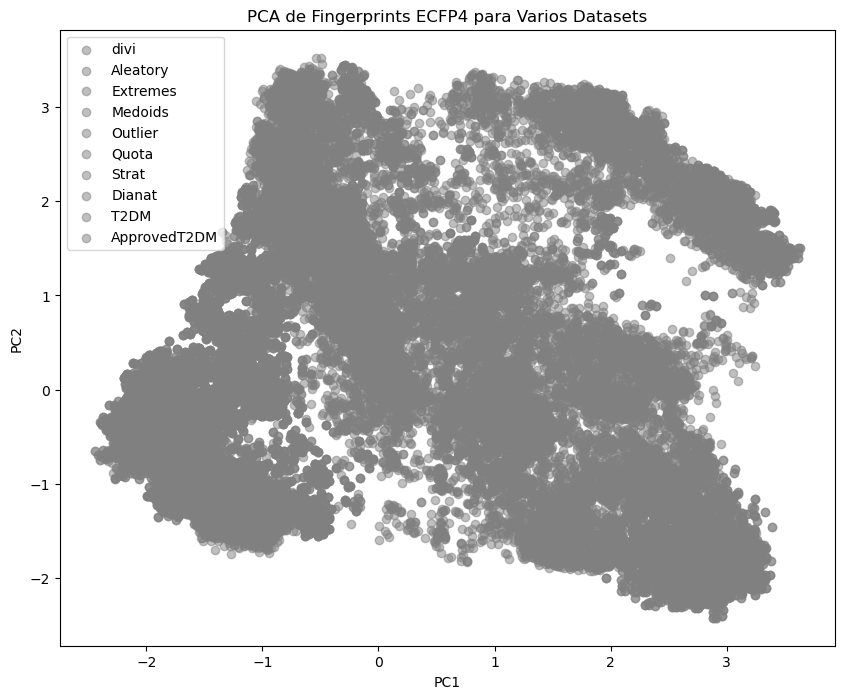

In [20]:
# Asegurarnos de que el DataFrame y los fingerprints tienen la misma longitud
concatenated_df = concatenated_df.loc[[fp is not None for fp in fingerprints]]
dataset_labels = concatenated_df['DATASET'].values

# Aplicar PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(ecfp4_matrix)

# Convertir los resultados del PCA a un DataFrame
pca_df = pd.DataFrame(pca_result, columns=['PC1', 'PC2'])
pca_df['DATASET'] = dataset_labels

# Graficar PCA con colores diferentes para cada dataset
unique_datasets = pca_df['DATASET'].unique()

plt.figure(figsize=(10, 8))
for dataset in unique_datasets:
    subset = pca_df[pca_df['DATASET'] == dataset]
    if dataset == 'tu_dataset_destacado':  # Cambia el nombre aquí según cuál destacar
        plt.scatter(subset['PC1'], subset['PC2'], label=dataset, color='green')
    else:
        plt.scatter(subset['PC1'], subset['PC2'], label=dataset, color='grey', alpha=0.5)

plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend()
plt.title("PCA de Fingerprints ECFP4 para Varios Datasets")
plt.show()


In [ ]:
# Graficar PCA con colores diferentes para cada dataset
unique_datasets = pca_df['DATASET'].unique()

plt.figure(figsize=(10, 8))
for dataset in unique_datasets:
    subset = pca_df[pca_df['DATASET'] == dataset]
    if dataset == 'divi':  # Cambia el nombre aquí según cuál destacar
        plt.scatter(subset['PC1'], subset['PC2'], label=dataset, color='green')
    else:
        plt.scatter(subset['PC1'], subset['PC2'], label=dataset, color='grey', alpha=0.5)

plt.xlabel("PC1")
plt.ylabel("PC2
")
plt.legend()
plt.title("PCA de Fingerprints ECFP4 para Varios Datasets")
plt.show()

In [ ]:
import numpy as np

# Mezclar los datos para que se ploteen en orden aleatorio
unique_datasets = np.random.permutation(pca_df['DATASET'].unique())

plt.figure(figsize=(10, 8))
for dataset in unique_datasets:
    subset = pca_df[pca_df['DATASET'] == dataset]
    # Si es el dataset que queremos destacar, lo ponemos en verde con alpha=1
    if dataset == 'divi':  # Cambia aquí según tu dataset
        plt.scatter(subset['PC1'], subset['PC2'], label=dataset, color='green', alpha=1)
    else:
        # Otros datasets en gris con transparencia
        plt.scatter(subset['PC1'], subset['PC2'], label=dataset, color='grey', alpha=0.5)

plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend()
plt.title("PCA de Fingerprints ECFP4 para Varios Datasets (Orden Aleatorio)")
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Configurar estilo
sns.set(style="whitegrid")

# Lista de los nombres de tus datasets
datasets = ['divi', 'Aleatory', 'Extremes', 'Medoids', 'Outlier', 'Quota', 'Strat', 'Dianat', 'T2DM' ,'ApprovedT2DM']
filas = 2
columnas = 5

# Crear una figura y los ejes de subplots (cuadrícula) y ajustar el tamaño
fig, axes = plt.subplots(filas, columnas, figsize=(22, 12))

# Aplanar los ejes en una lista para facilitar el acceso en una cuadrícula de 3x3
axes = axes.flatten()

# Iterar sobre cada dataset y su respectivo subplot
for i, dataset in enumerate(datasets):
    # Crear una máscara para resaltar los puntos del dataset actual en verde
    mask = pca_df['DATASET'] == dataset

    # Seleccionar el subplot correspondiente
    ax = axes[i]

    # Graficar los puntos en gris para todos los datos excepto el dataset actual
    sns.scatterplot(x='PC1', y='PC2', data=pca_df[~mask], color='gray', alpha=0.5, ax=ax)

    # Graficar los puntos del dataset actual en verde
    sns.scatterplot(x='PC1', y='PC2', data=pca_df[mask], color='cornflowerblue', s=100, ax=ax, label=dataset)

    # Añadir título y etiquetas a cada subplot
    ax.set_title(f'Dataset: {dataset}')
    ax.set_xlabel('PC1')
    ax.set_ylabel('PC2')

# Ajustar el diseño para evitar solapamientos y mejorar la presentación
plt.tight_layout()

# Mostrar todos los gráficos en la cuadrícula
plt.show()


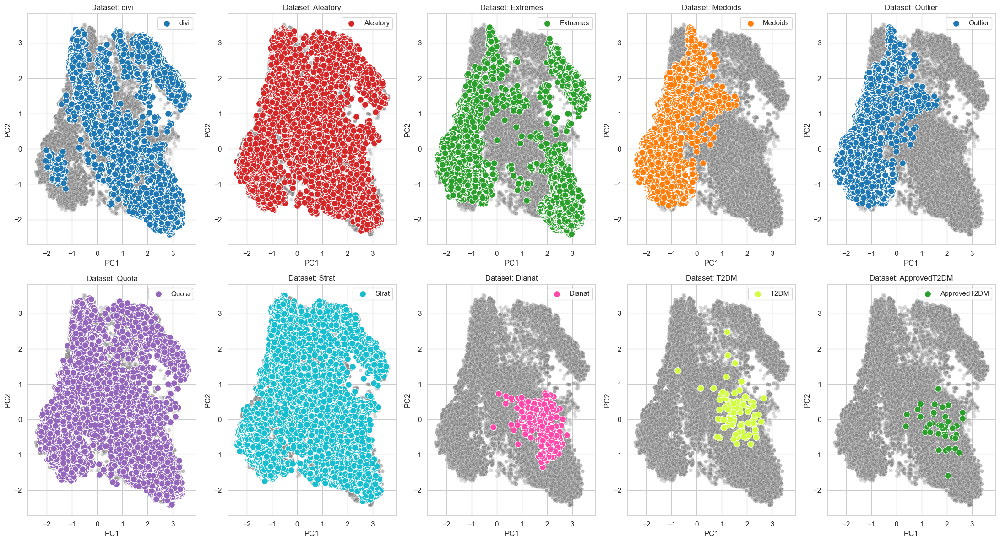

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Configurar estilo
sns.set(style="whitegrid")

# Diccionario de colores específicos para cada dataset
color_dict = {
    'Extremes': '#2ca02c',     # Verde
    'Medoids': '#ff7f0e',      # Naranja
    'Outlier': '#1f77b4',      # Verde otro
    'Quota': '#9467bd',        # Púrpura
    'Strat': '#17becf',        # Azul cian
    'Dianat': '#ff4aab',       # Rosa
    'T2DM': '#d1ff3f',         # Verde lima
    'ApprovedT2DM': '#2ca02c', # Verde bosque
    'divi': '#1f77b4',         # Azul
    'Aleatory': '#d62728'      # Rojo

}

# Lista de los nombres de los datasets para iterar en la cuadrícula
datasets = ['divi', 'Aleatory', 'Extremes', 'Medoids', 'Outlier', 'Quota', 'Strat', 'Dianat', 'T2DM', 'ApprovedT2DM']

# Configuración de filas y columnas para la cuadrícula de subplots
filas, columnas = 2, 5
fig, axes = plt.subplots(filas, columnas, figsize=(22, 12))
axes = axes.flatten()

# Iterar sobre cada dataset y su respectivo subplot
for i, dataset in enumerate(datasets):
    # Crear una máscara para resaltar los puntos del dataset actual
    mask = pca_df['DATASET'] == dataset

    # Seleccionar el subplot correspondiente
    ax = axes[i]

    # Graficar los puntos en gris para todos los datos excepto el dataset actual
    sns.scatterplot(x='PC1', y='PC2', data=pca_df[~mask], color='gray', alpha=0.3, ax=ax)

    # Graficar los puntos del dataset actual en su color específico
    sns.scatterplot(x='PC1', y='PC2', data=pca_df[mask], color=color_dict.get(dataset, 'green'),
                    s=100, ax=ax, label=dataset)

    # Añadir título y etiquetas a cada subplot
    ax.set_title(f'Dataset: {dataset}')
    ax.set_xlabel('PC1')
    ax.set_ylabel('PC2')

# Ajustar diseño para evitar solapamientos
plt.tight_layout()

# Mostrar la cuadrícula de gráficos
plt.show()


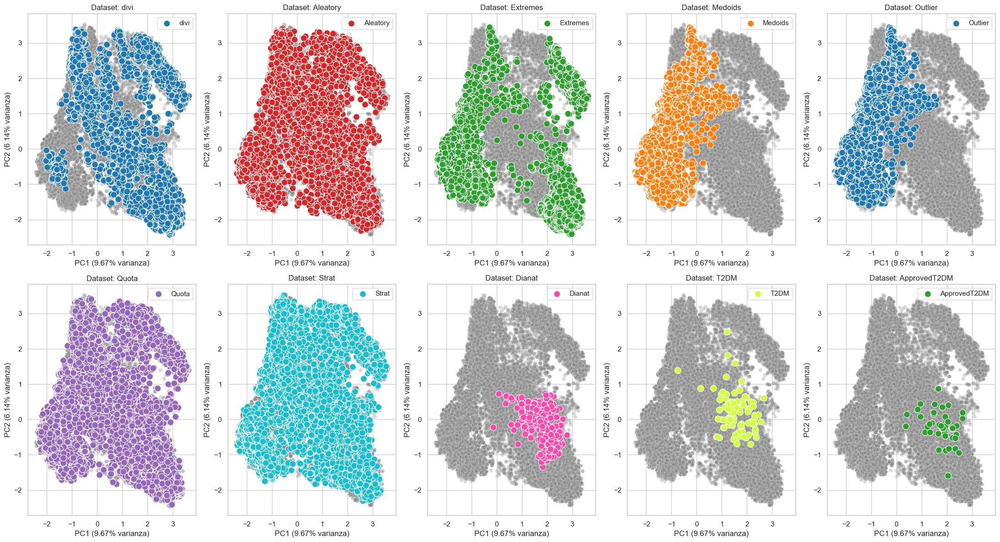

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Configurar estilo
sns.set(style="whitegrid")

# Diccionario de colores específicos para cada dataset
color_dict = {
    'Extremes': '#2ca02c',     # Verde
    'Medoids': '#ff7f0e',      # Naranja
    'Outlier': '#1f77b4',      # Azul
    'Quota': '#9467bd',        # Púrpura
    'Strat': '#17becf',        # Cian
    'Dianat': '#ff4aab',       # Rosa
    'T2DM': '#d1ff3f',         # Verde lima
    'ApprovedT2DM': '#2ca02c', # Verde bosque
    'divi': '#1f77b4',         # Azul
    'Aleatory': '#d62728'      # Rojo
}

# Lista de los nombres de los datasets
datasets = ['divi', 'Aleatory', 'Extremes', 'Medoids', 'Outlier', 'Quota', 'Strat', 'Dianat', 'T2DM', 'ApprovedT2DM']

# Configuración de subplots
filas, columnas = 2, 5
fig, axes = plt.subplots(filas, columnas, figsize=(22, 12))
axes = axes.flatten()

# Obtener la varianza explicada
explained_var_ratio = pca.explained_variance_ratio_

# Iterar sobre cada dataset y su respectivo subplot
for i, dataset in enumerate(datasets):
    mask = pca_df['DATASET'] == dataset
    ax = axes[i]

    # Graficar puntos en gris (resto de los datos)
    sns.scatterplot(x='PC1', y='PC2', data=pca_df[~mask], color='gray', alpha=0.3, ax=ax)

    # Graficar puntos del dataset actual en su color específico
    sns.scatterplot(x='PC1', y='PC2', data=pca_df[mask], color=color_dict.get(dataset, 'green'),
                    s=100, ax=ax, label=dataset)

    # Añadir título y etiquetas con varianza explicada
    ax.set_title(f'Dataset: {dataset}')
    ax.set_xlabel(f'PC1 ({explained_var_ratio[0]:.2%} varianza)')
    ax.set_ylabel(f'PC2 ({explained_var_ratio[1]:.2%} varianza)')

# Ajustar diseño
plt.tight_layout()
plt.show()

In [23]:
import pandas as pd

# Crear tabla con la varianza explicada por cada dataset
datasets = ['divi', 'Aleatory', 'Extremes', 'Medoids', 'Outlier', 'Quota', 'Strat', 'Dianat', 'T2DM', 'ApprovedT2DM']
explained_var_dict = {dataset: pca.explained_variance_ratio_ for dataset in datasets}

# Convertir a DataFrame
explained_var_table = pd.DataFrame(explained_var_dict, index=[f'PC{i+1}' for i in range(len(pca.explained_variance_ratio_))])

# Transponer para organizar los datasets en filas
explained_var_table = explained_var_table.T

# Formatear los valores en porcentaje
explained_var_table = explained_var_table.applymap(lambda x: f'{x:.2%}')

print(explained_var_table)

                PC1    PC2
divi          9.67%  6.14%
Aleatory      9.67%  6.14%
Extremes      9.67%  6.14%
Medoids       9.67%  6.14%
Outlier       9.67%  6.14%
Quota         9.67%  6.14%
Strat         9.67%  6.14%
Dianat        9.67%  6.14%
T2DM          9.67%  6.14%
ApprovedT2DM  9.67%  6.14%


C:\Users\zonam\AppData\Local\Temp\ipykernel_12196\3201878439.py:14: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  explained_var_table = explained_var_table.applymap(lambda x: f'{x:.2%}')


In [ ]:
import matplotlib.pyplot as plt

# Diccionario de colores de cada dataset
color_dict = {
    'divi': '#1f77b4',         # Azul
    'Aleatory': '#d62728',     # Rojo
    'Extremes': '#2ca02c',     # Verde
    'Medoids': '#ff7f0e',      # Naranja
    'Outlier': '#1f77b4',      # Verde otro
    'Quota': '#9467bd',        # Púrpura
    'Strat': '#17becf',        # Azul cian
    'Dianat': '#e377c2',       # Rosa
    'T2DM': '#bcbd22',         # Verde lima
    'ApprovedT2DM': '#2ca02c'  # Verde bosque
}

# Lista ordenada de datasets
datasets = ['divi', 'Aleatory', 'Extremes', 'Medoids', 'Outlier', 'Quota', 'Strat', 'Dianat', 'T2DM', 'ApprovedT2DM']

# Crear una figura para la leyenda
fig, ax = plt.subplots(figsize=(6, 6))

# Recorrer la lista ordenada de datasets y colores
for dataset in datasets:
    color = color_dict[dataset]
    ax.scatter([], [], color=color, label=dataset, s=300)

# Configuración de la leyenda
ax.legend(loc='center', frameon=False, title="Bases de datos", fontsize=20, title_fontsize=24)
ax.axis("off")  # Quitar los ejes

# Mostrar la leyenda
plt.show()


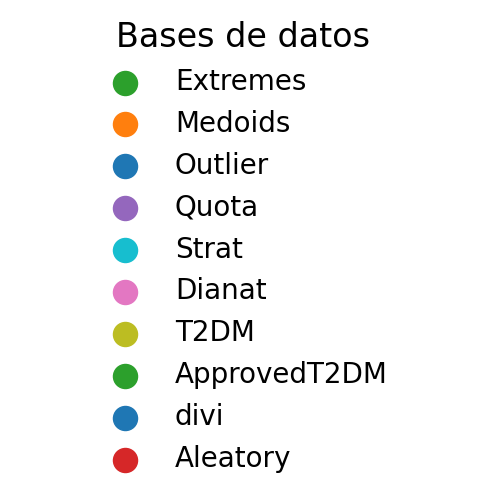

In [ ]:
import matplotlib.pyplot as plt

# Diccionario de colores de cada dataset
color_dict = {
    'Extremes': '#2ca02c',     # Verde
    'Medoids': '#ff7f0e',      # Naranja
    'Outlier': '#1f77b4',      # Verde otro
    'Quota': '#9467bd',        # Púrpura
    'Strat': '#17becf',        # Azul cian
    'Dianat': '#e377c2',       # Rosa
    'T2DM': '#bcbd22',         # Verde lima
    'ApprovedT2DM': '#2ca02c', # Verde bosque
    'divi': '#1f77b4',         # Azul
    'Aleatory': '#d62728'      # Rojo
}

# Crear una figura para la leyenda
fig, ax = plt.subplots(figsize=(6, 6))

# Recorrer cada dataset y color para crear un punto en la leyenda
for dataset, color in color_dict.items():
    ax.scatter([], [], color=color, label=dataset, s=00)

# Configuración de la leyenda
ax.legend(loc='center', frameon=False, title="Bases de datos", fontsize=20, title_fontsize=24)
ax.axis("off")  # Quitar los ejes

# Mostrar la leyenda
plt.show()


In [ ]:
# Función para calcular las propiedades
def calculate_properties(smiles):
    mol = Chem.MolFromSmiles(smiles)
    if mol:
        mol_weight = Descriptors.MolWt(mol)
        logp = MolLogP(mol)
        tpsa = CalcTPSA(mol)
        nrb = Descriptors.NumRotatableBonds(mol)
        hba = Descriptors.NumHAcceptors(mol)
        hbd = Descriptors.NumHDonors(mol)
        return pd.Series([mol_weight, logp, tpsa, nrb, hba, hbd])
    else:
        return pd.Series([None, None, None, None, None, None])

In [ ]:
dfs = [concatenated_df]
for i, df in enumerate(dfs):
   df[['MolWt', 'LogP', 'TPSA', 'nRB', 'HBA', 'HBD']] = df['SMILES'].apply(calculate_properties)

df


,Unnamed: 0,ID,SMILES,DATASET,MolWt,LogP,TPSA,nRB,HBA,HBD
0,0,47035,COc1cc(CCC(=O)O)ccc1OCc1cccc(-c2coc3[nH]cnc23)c1,divi,392.411,4.42770,97.58,8.0,5.0,2.0
1,1,102444,O=c1cc(-c2ccc3c(c2)OC(c2cccc(-c4ccccc4)c2)O3)o...,divi,357.365,4.77190,64.46,3.0,4.0,1.0
2,2,83650,COC1C(=O)N(CCC(=O)O)CC1OCC1CCCC2(c3ccccc3)CC12,divi,387.476,2.46150,76.07,8.0,4.0,1.0
3,3,31287,COc1cc(CCc2nc(=S)s[nH]2)ccc1OCc1cccc([N+]2[C-]...,divi,481.628,5.55508,77.96,8.0,9.0,2.0
4,4,91489,COC1C2CC3CC(CC1(OCC1CC=CC(c4ccccc4)O1)C3)C2CCC...,divi,426.553,4.77400,64.99,8.0,4.0,1.0
...,...,...,...,...,...,...,...,...,...,...
70507,70507,DB01124,CCCCNC(=O)NS(=O)(=O)c1ccc(C)cc1,ApprovedT2DM,270.354,1.78302,75.27,5.0,3.0,2.0
70508,70508,DB00273,CC1(C)OC2COC3(COS(N)(=O)=O)OC(C)(C)OC3C2O1,ApprovedT2DM,339.366,-0.39540,115.54,3.0,8.0,1.0
70509,70509,DB15323,Cn1c(=O)cc(N2CCCC(N)C2)n(Cc2cc(F)ccc2C#N)c1=O,ApprovedT2DM,357.389,0.53358,97.05,3.0,7.0,1.0
70510,70510,DB04876,N#CC1CCCN1C(=O)CNC12CC3CC(CC(O)(C3)C1)C2,ApprovedT2DM,303.406,1.17428,76.36,3.0,4.0,2.0


In [ ]:
#concatenated_df.to_csv("concatenatedLV.csv", index=True)
#from google.colab import files
#files.download("concatenatedLV.csv")

## PCA y Kmeans


In [ ]:
#scaled_df

NameError: name 'scaled_df' is not defined

In [ ]:
df.columns

Index(['Unnamed: 0', 'ID', 'SMILES', 'DATASET', 'MolWt', 'LogP', 'TPSA', 'nRB',
       'HBA', 'HBD'],
      dtype='object')

In [ ]:
PCA_df = df.drop(columns=['Unnamed: 0', 'SMILES'])
PCA_df = PCA_df.set_index('ID')

PCA_df

,DATASET,MolWt,LogP,TPSA,nRB,HBA,HBD
ID,,,,,,,
47035,divi,392.411,4.42770,97.58,8.0,5.0,2.0
102444,divi,357.365,4.77190,64.46,3.0,4.0,1.0
83650,divi,387.476,2.46150,76.07,8.0,4.0,1.0
31287,divi,481.628,5.55508,77.96,8.0,9.0,2.0
91489,divi,426.553,4.77400,64.99,8.0,4.0,1.0
...,...,...,...,...,...,...,...
DB01124,ApprovedT2DM,270.354,1.78302,75.27,5.0,3.0,2.0
DB00273,ApprovedT2DM,339.366,-0.39540,115.54,3.0,8.0,1.0
DB15323,ApprovedT2DM,357.389,0.53358,97.05,3.0,7.0,1.0


In [ ]:
#df.set_index('')

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

data_pca = PCA_df.copy()
#data_pca = data_pca.drop(labels = ['ID'],axis = 1)
#data_pca = data_pca.drop(labels = ['DB'],axis = 1)
data_pca = data_pca.drop(labels = ['DATASET'],axis = 1)
#What StandardScaler() does is scaling the data. The fit.transform() module fits these new values to the data,
#and stores them, replacing the old values.
data_pca = StandardScaler().fit_transform(data_pca)
#Apply PCA on the transformed (scaled and centered) data:
pca = PCA(n_components=2)
pca_results = pca.fit_transform(data_pca)
pca_results

array([[  0.30506976,  -0.52212465],
       [ -3.77724489,  -1.81938849],
       [ -0.61772921,  -1.20332037],
       ...,
       [ -1.00062607,  -3.99641732],
       [ -2.7046553 ,  -5.0864768 ],
       [  4.95271689, -10.51799485]])

In [ ]:
pca_dataset = pd.DataFrame(pca_results, index=PCA_df.index, columns=['PC1', 'PC2'])
pca_dataset

,PC1,PC2
ID,,
47035,0.305070,-0.522125
102444,-3.777245,-1.819388
83650,-0.617729,-1.203320
31287,1.509447,2.248935
91489,-1.092684,0.766578
...,...,...
DB01124,-2.672111,-4.825230
DB00273,-0.138807,-4.830077
DB15323,-1.000626,-3.996417


In [ ]:
pca_dataset

<Axes: title={'center': 'Component PCA for AprrovedT2DM'}, xlabel='PC1', ylabel='PC2'>

<Figure size 640x480 with 0 Axes>

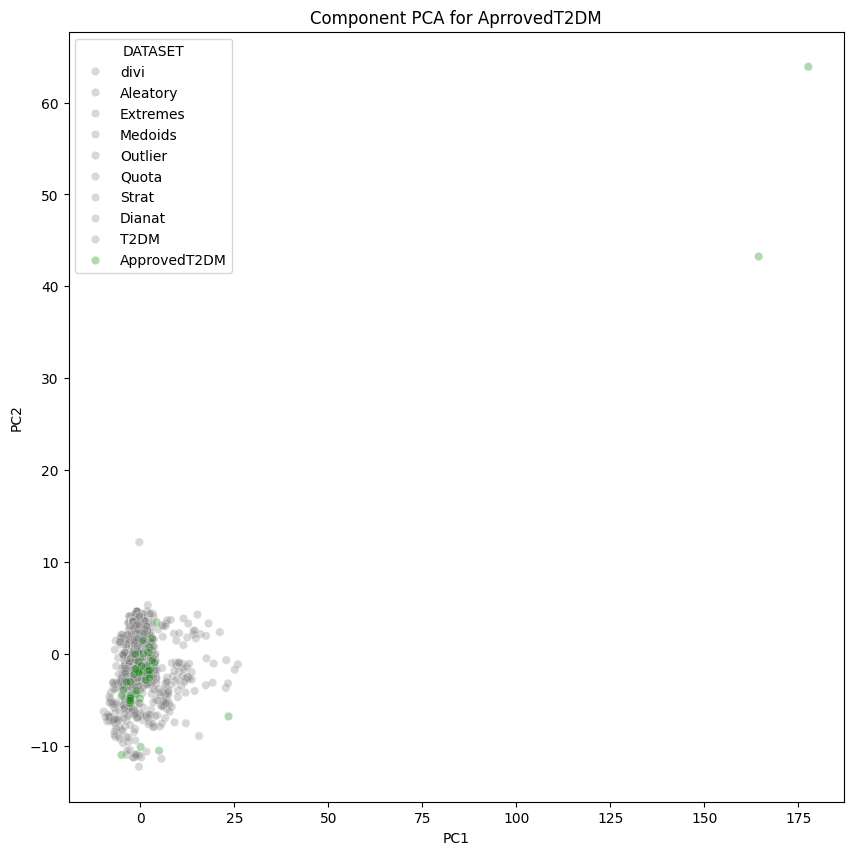

In [ ]:
#pca_dataset = pd.DataFrame(data = pca_results, columns = ['component1', 'component2','component3'] )
pca_dataset['DATASET']=PCA_df['DATASET']
plt.figure()
plt.figure(figsize=(10,10))
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('Component PCA for AprrovedT2DM')
sns.scatterplot(x = pca_dataset['PC1'], y = pca_dataset['PC2'], hue=pca_dataset['DATASET'],
                alpha=0.3,palette=["grey", "grey", "grey", "grey", "grey", "grey", "grey", "grey", "grey", "green"])

In [ ]:
valores_unicos = pca_dataset['DATASET'].unique()
print(valores_unicos)

['divi' 'Aleatory' 'Extremes' 'Medoids' 'Outlier' 'Quota' 'Strat' 'Dianat'
 'T2DM' 'ApprovedT2DM']


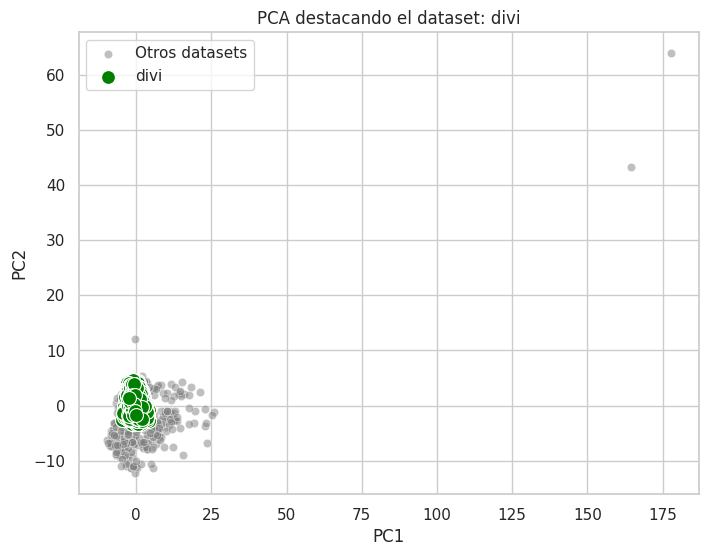

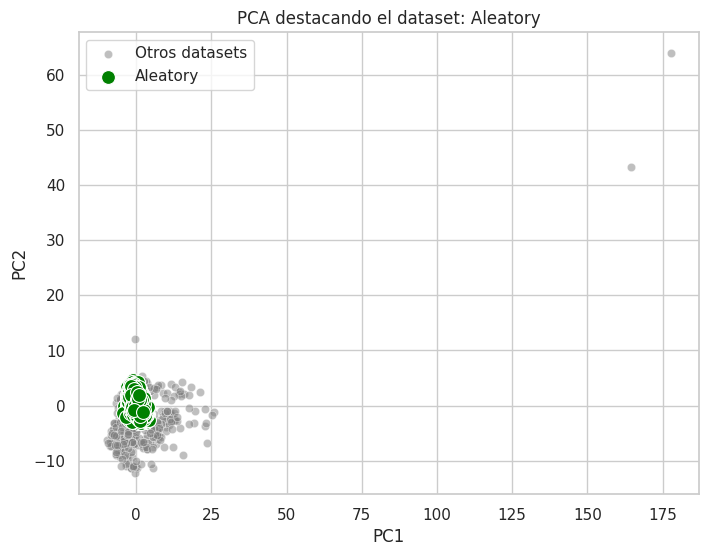

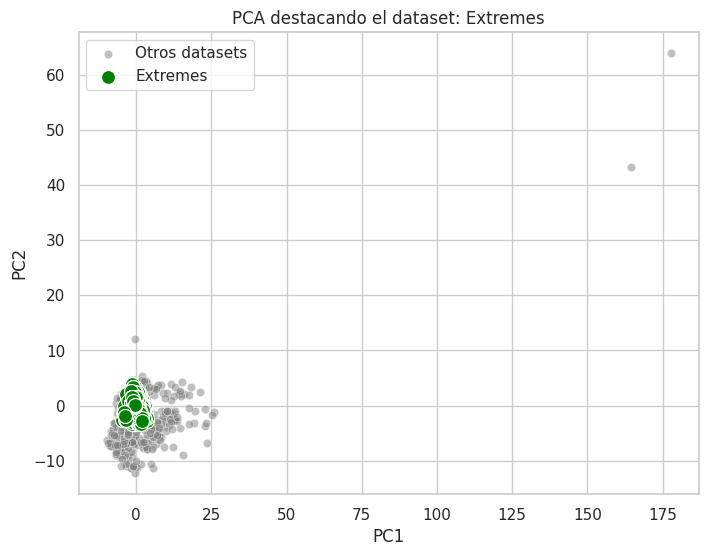

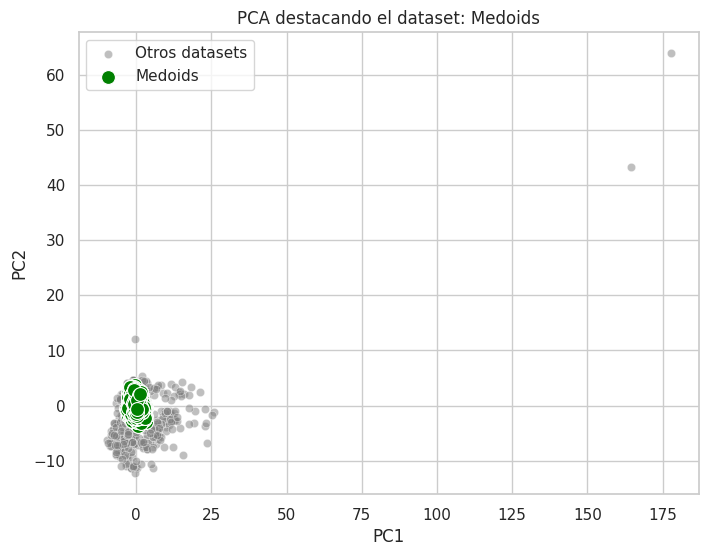

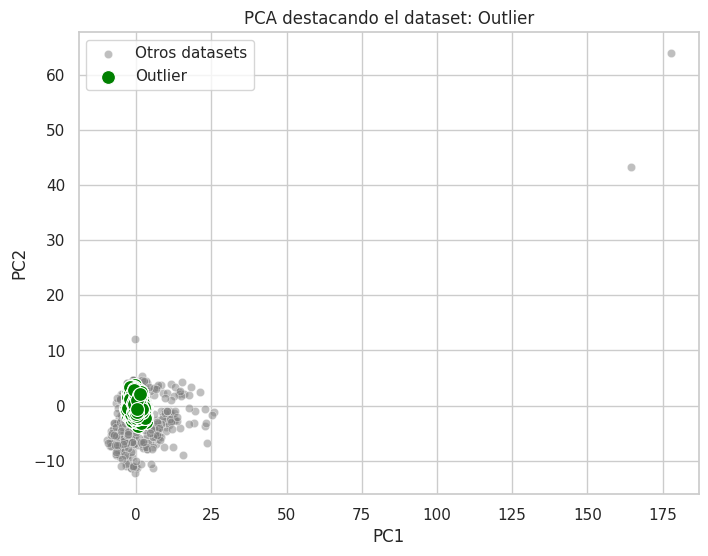

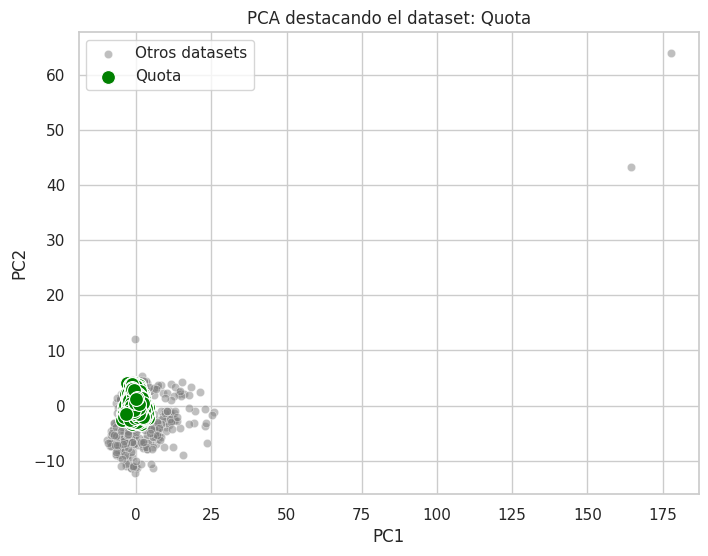

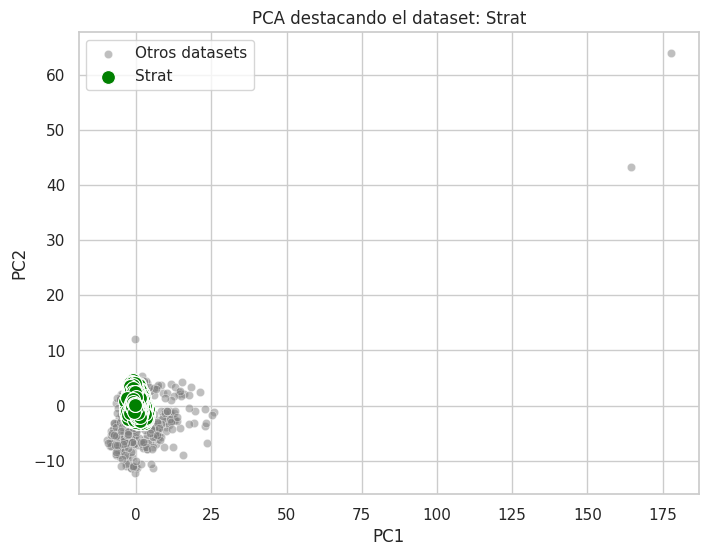

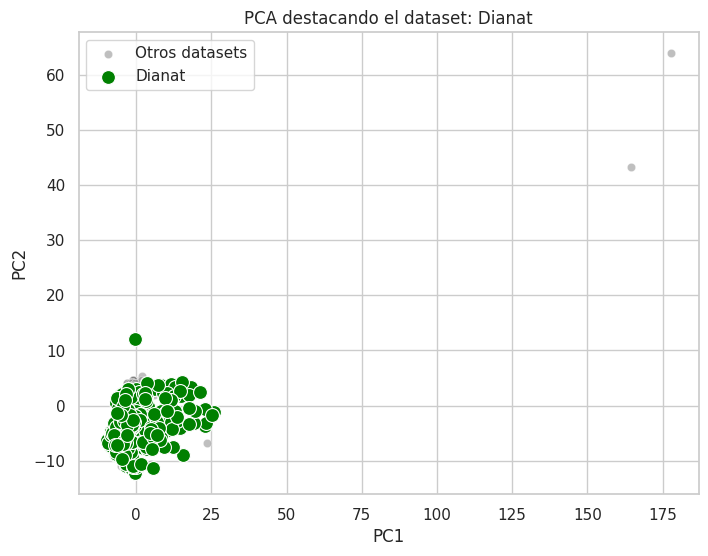

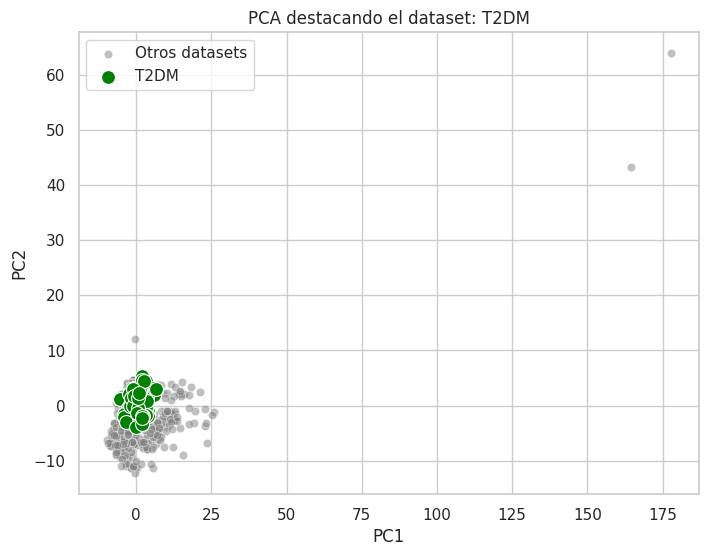

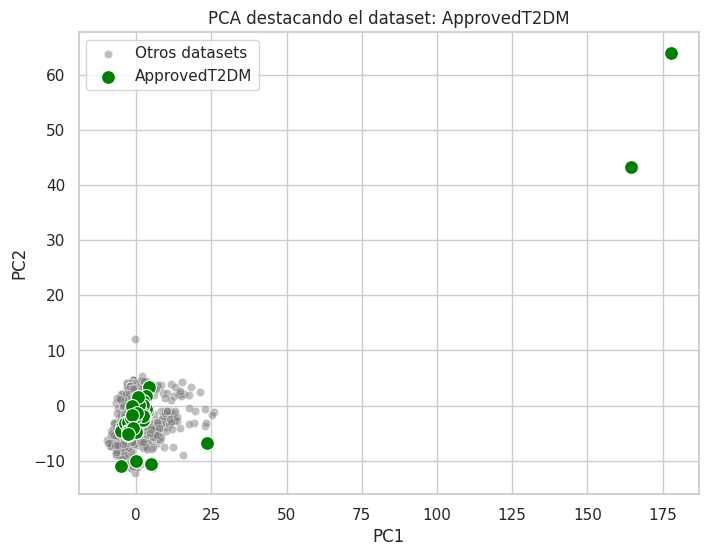

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Configurar estilo
sns.set(style="whitegrid")

# Lista de los nombres de tus datasets para colorear de verde en su respectiva gráfica
datasets = ['divi', 'Aleatory', 'Extremes', 'Medoids', 'Outlier', 'Quota', 'Strat', 'Dianat',
 'T2DM', 'ApprovedT2DM']

# Iterar sobre cada dataset
for dataset in datasets:
    # Crear una máscara para los puntos a resaltar (en verde)
    mask = pca_dataset['DATASET'] == dataset

    # Gráfico
    plt.figure(figsize=(8, 6))

    # Graficar los puntos en gris (todos menos el dataset actual)
    sns.scatterplot(x='PC1', y='PC2', data=pca_dataset[~mask], color='gray', alpha=0.5, label="Otros datasets")

    # Graficar los puntos del dataset actual en verde
    sns.scatterplot(x='PC1', y='PC2', data=pca_dataset[mask], color='green', s=100, label=dataset)

    # Añadir etiquetas y título
    plt.title(f'PCA destacando el dataset: {dataset}')
    plt.xlabel('PC1')
    plt.ylabel('PC2')

    # Mostrar leyenda
    plt.legend()

    # Mostrar gráfico
    plt.show()


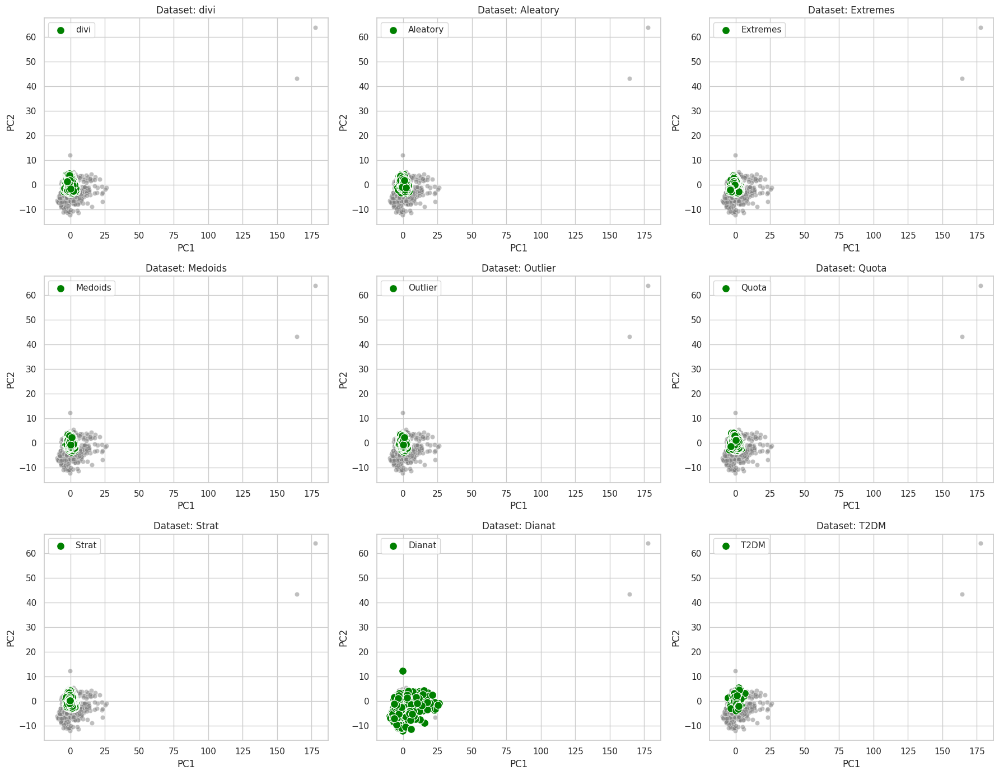

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Configurar estilo
sns.set(style="whitegrid")

# Lista de los nombres de tus datasets
datasets = ['divi', 'Aleatory', 'Extremes', 'Medoids', 'Outlier', 'Quota', 'Strat', 'Dianat',
 'T2DM']
# Definir el número de filas y columnas para la cuadrícula
filas = 3
columnas = 3

# Crear una figura y los ejes de subplots (cuadrícula)
#fig, axes = plt.subplots(filas, columnas, figsize=(15, 12))
# Aumentar el tamaño de la figura
fig, axes = plt.subplots(filas, columnas, figsize=(18, 14))  # Aumenta el tamaño

# Aplanar los ejes en una lista para facilitar el acceso (de 3x3 a una lista de 9 elementos)
axes = axes.flatten()

# Iterar sobre cada dataset y su respectivo subplot
for i, dataset in enumerate(datasets):
    # Crear una máscara para los puntos a resaltar (en verde)
    mask = pca_dataset['DATASET'] == dataset

    # Seleccionar el subplot correspondiente
    ax = axes[i]

    # Graficar los puntos en gris (todos menos el dataset actual)
    sns.scatterplot(x='PC1', y='PC2', data=pca_dataset[~mask], color='gray', alpha=0.5, ax=ax, )

    # Graficar los puntos del dataset actual en verde
    sns.scatterplot(x='PC1', y='PC2', data=pca_dataset[mask], color='green', s=100, ax=ax, label=dataset)

    # Añadir título al subplot
    ax.set_title(f'Dataset: {dataset}')
    ax.set_xlabel('PC1')
    ax.set_ylabel('PC2')

# Ajustar diseño para evitar superposiciones
plt.tight_layout()

# Mostrar todos los gráficos
plt.show()


In [ ]:
# Visualizar los resultados
plt.figure(figsize=(10, 10))
plt.scatter(pca_df['PC1'], pca_df['PC2'])

# Añadir etiquetas
for label, x, y in zip(pca_df.index, pca_df['PC1'], pca_df['PC2']):
    plt.annotate(label, xy=(x, y), xytext=(5, 5), textcoords='offset points')

plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('PCA de ATP Types')
plt.grid(True)
plt.show()

NameError: name 'pca_df' is not defined

<Figure size 1000x1000 with 0 Axes>

In [ ]:
from sklearn.cluster import KMeans
import seaborn as sns

# Aplicar K-means clustering
kmeans = KMeans(n_clusters=3, random_state=0).fit(data)
caled_df.index = kmeans.labels_

# Visualizar los clusters
plt.figure(figsize=(10, 7))
sns.scatterplot(x='0', y='1', hue='Cluster', data=caled_df, palette='viridis')
plt.title('K-means Clustering')
plt.show()
